SOAL 1 WAV


In [ ]:

import numpy as np
import librosa, librosa.display
import matplotlib.pyplot as plt
import soundfile as sf
import os 

def plot_waveform(y, sr, title="Waveform"):
    plt.figure(figsize=(12,3))
    librosa.display.waveshow(y, sr=sr)
    plt.title(title)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.show()

def plot_spectrogram(y, sr, title="Spectrogram (dB)", n_fft=2048, hop_length=512):
    S = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length))
    S_db = librosa.amplitude_to_db(S, ref=np.max)
    plt.figure(figsize=(12,4))
    librosa.display.specshow(S_db, sr=sr, hop_length=hop_length, x_axis="time", y_axis="linear")
    plt.colorbar(format="%+2.0f dB")
    plt.title(title)
    plt.show()

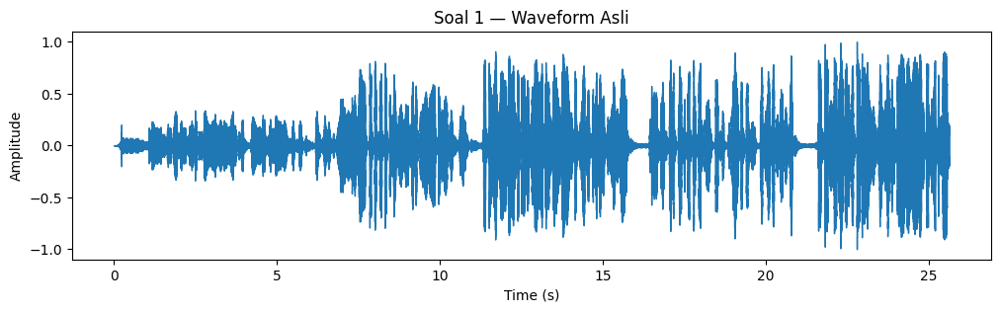

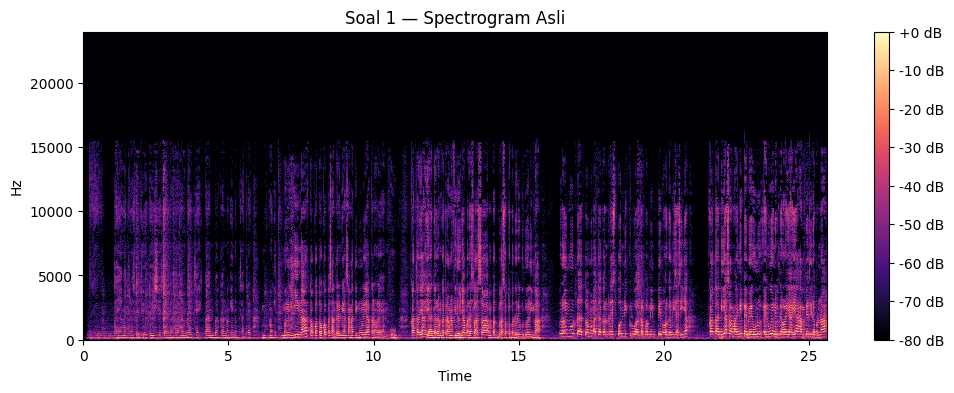

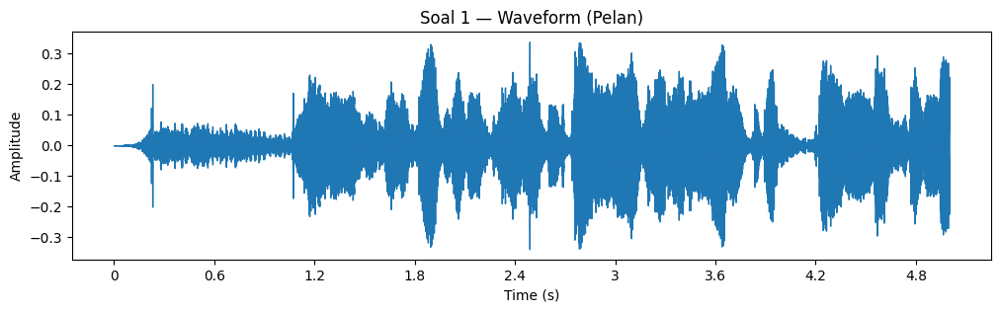

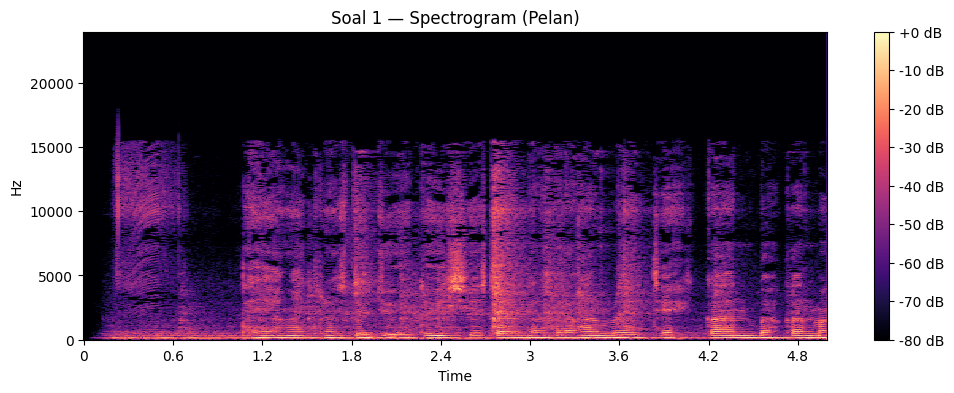

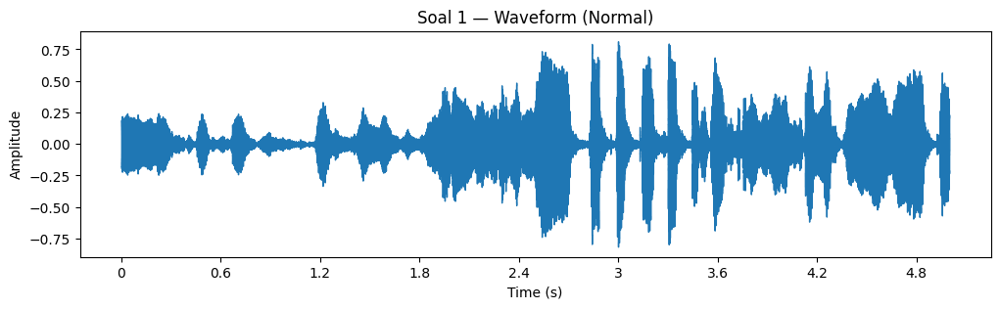

...

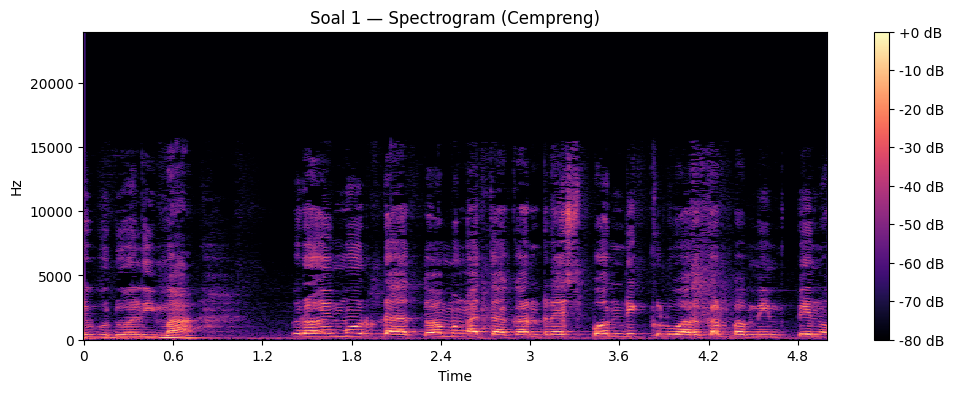

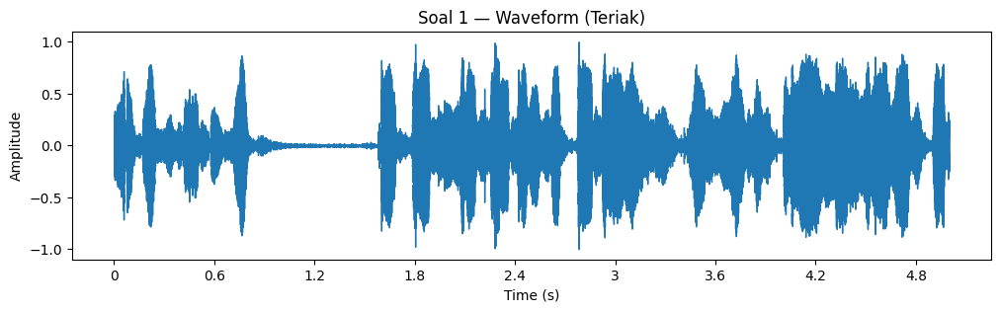

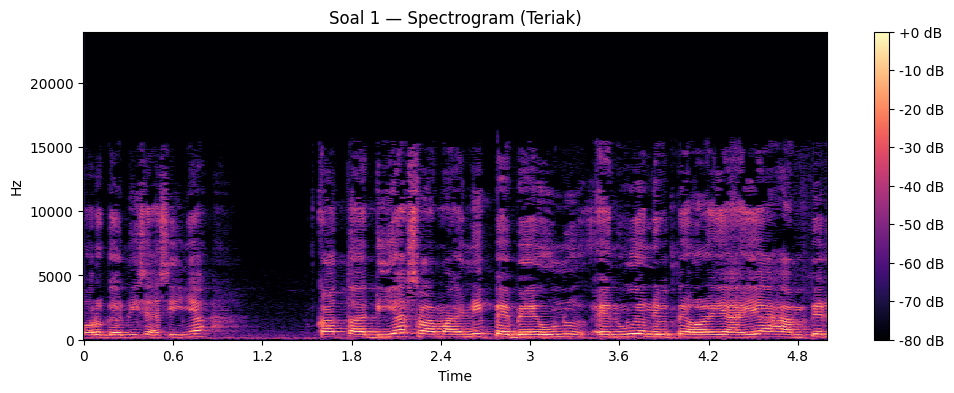

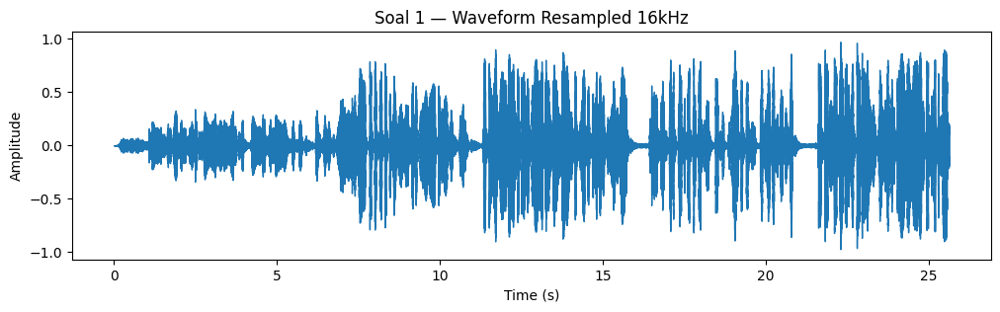

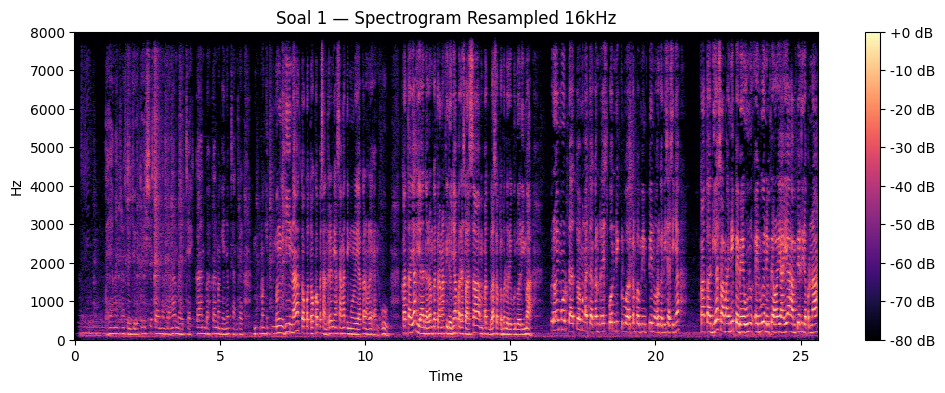

In [16]:
SOAL1_WAV = "Suarahamka.wav"
y1, sr1 = librosa.load(SOAL1_WAV, sr=None, mono=True)
y1 = librosa.util.normalize(y1)

plot_waveform(y1, sr1, "Soal 1 — Waveform Asli")
plot_spectrogram(y1, sr1, "Soal 1 — Spectrogram Asli")

# Bagi jadi 5 segmen
seg_dur = 5
labels = ["Pelan", "Normal", "Keras", "Cempreng", "Teriak"]
for i, label in enumerate(labels):
    start, end = int(i*seg_dur*sr1), int((i+1)*seg_dur*sr1)
    seg = y1[start:end]
    plot_waveform(seg, sr1, f"Soal 1 — Waveform ({label})")
    plot_spectrogram(seg, sr1, f"Soal 1 — Spectrogram ({label})")

# Resampling
y1_rs = librosa.resample(y=y1, orig_sr=sr1, target_sr=16000)
plot_waveform(y1_rs, 16000, "Soal 1 — Waveform Resampled 16kHz")
plot_spectrogram(y1_rs, 16000, "Soal 1 — Spectrogram Resampled 16kHz")


- Suara **pelan** memiliki amplitudo yamg lebih rendah namun persebaran frekuensi yang lebih padat.
- suara **normal** menunjukan persebaran energi frekuensi yang lebih merata di spectogram
- Suara **keras/teriak** menunjukkan puncak amplitudo dan densitas warna (energi) tinggi pada spectrogram.
- Suara **cempreng** menonjol pada frekuensi yang rendah
- Resampling ke 16 kHz menurunkan resolusi frekuensi tinggi, tetapi durasi tetap sama.

SOAL NO 2

In [ ]:
import numpy as np
from scipy.signal import butter, sosfiltfilt

def sanitize_audio(y):
    # buang NaN/Inf dan clamp amplitudo
    y = np.nan_to_num(y, nan=0.0, posinf=0.0, neginf=0.0)
    # optional: hard-clip biar gak meledak
    y = np.clip(y, -1.0, 1.0)
    return y.astype(np.float32, copy=False)

def butter_filter(y, sr, ft, btype="low", order=6):
    # versi stabil: pakai SOS
    nyq = 0.5 * sr
    def norm_w(w):
        return np.clip(np.asarray(w, dtype=float) / nyq, 1e-6, 1 - 1e-6)

    if isinstance(ft, (list, tuple, np.ndarray)):
        Wn = norm_w(ft)
    else:
        Wn = norm_w([ft])[0]

    sos = butter(order, Wn, btype=btype, output='sos')
    # sosfiltfilt lebih stabil daripada filtfilt biasa
    y_out = sosfiltfilt(sos, y)
    return sanitize_audio(y_out)

# override fungsi plot supaya selalu sanitize dulu
def plot_spectrogram(y, sr, title="Spectrogram (dB)", n_fft=2048, hop_length=512):
    y = sanitize_audio(y)
    if not np.isfinite(y).all() or y.size < n_fft:
        # tambahkan sedikit noise putih kalau sinyal terlalu "flat"
        y = y + 1e-9*np.random.randn(*y.shape)
    S = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length))
    S_db = librosa.amplitude_to_db(S + 1e-12, ref=np.max)
    plt.figure(figsize=(12,4))
    librosa.display.specshow(S_db, sr=sr, hop_length=hop_length, x_axis="time", y_axis="linear")
    plt.colorbar(format="%+2.0f dB")
    plt.title(title)
    plt.show()

# helper band-pass aman
def safe_band(f1, f2, sr, pad=200, fmin=50):
    nyq = sr/2
    lo = max(fmin, int(f1))
    hi = min(int(nyq - pad), int(f2))
    if hi <= lo:
        hi = lo + 200
    # jangan biarkan hi melebihi nyquist-pad
    hi = min(hi, int(nyq - pad))
    return lo, hi


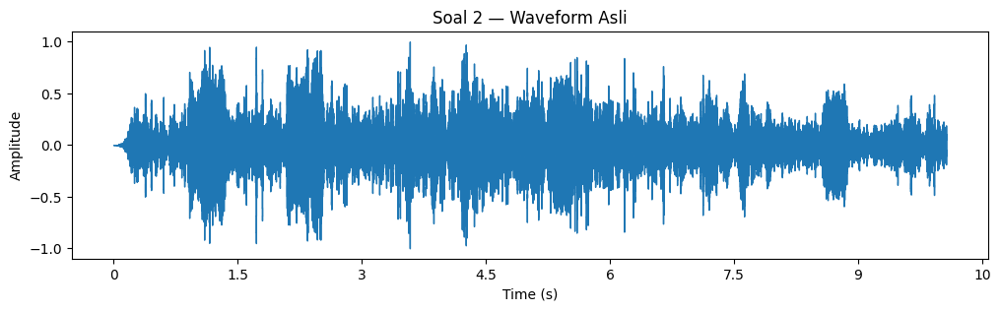

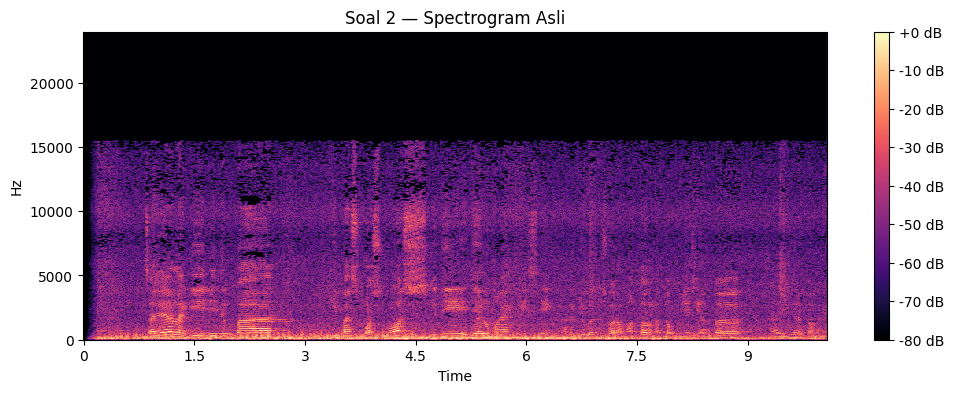

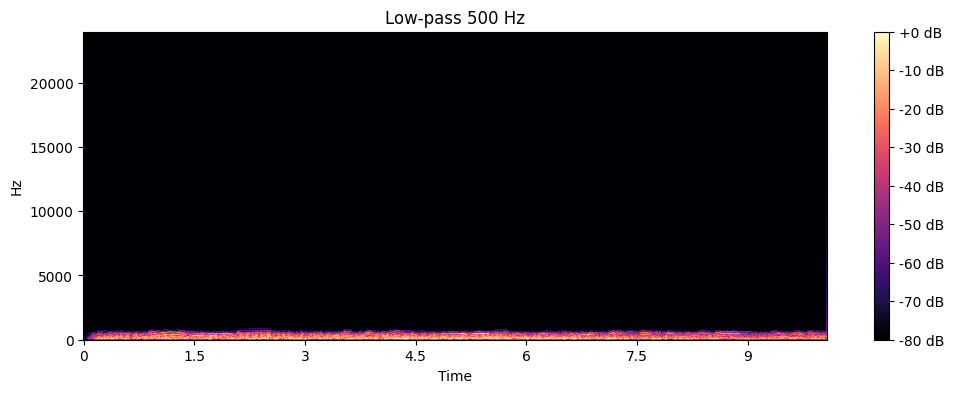

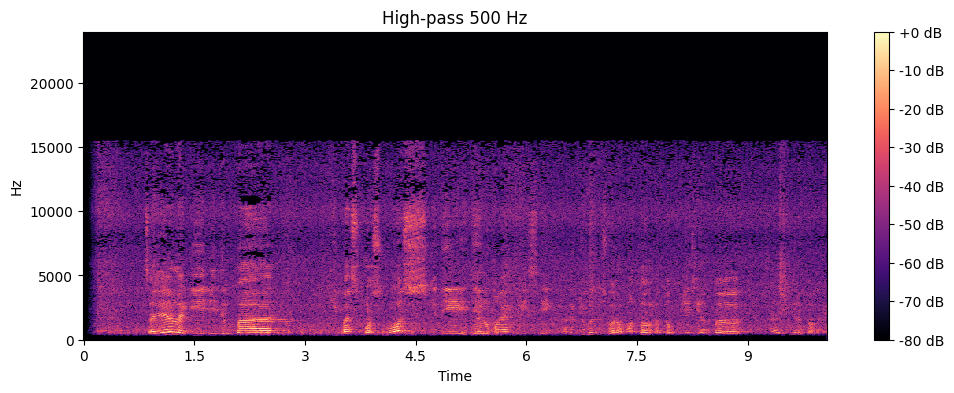

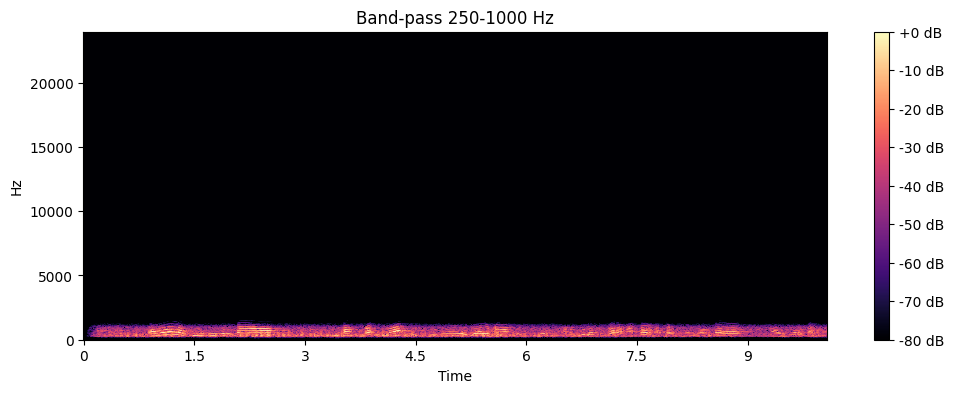

...

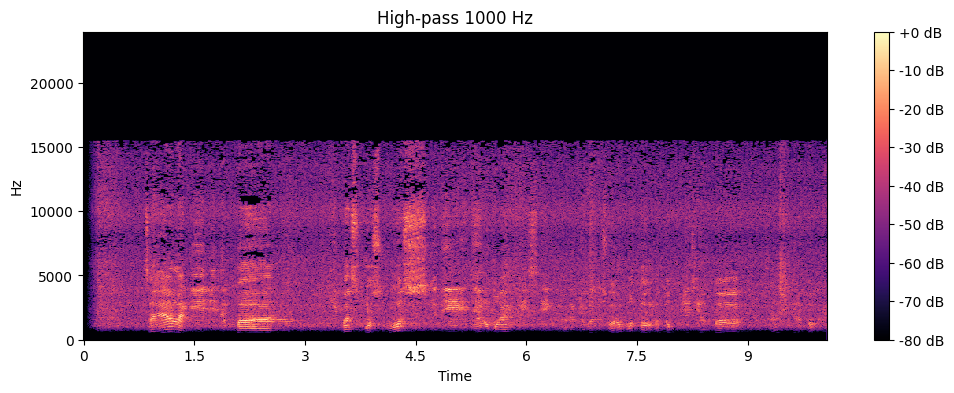

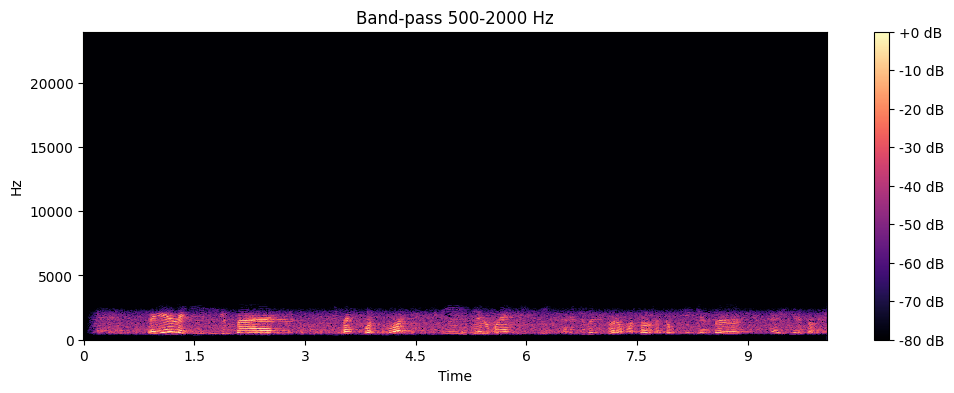

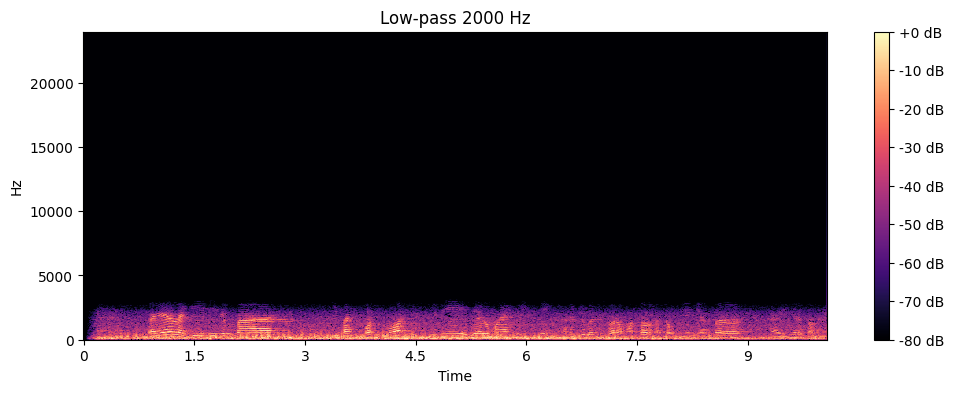

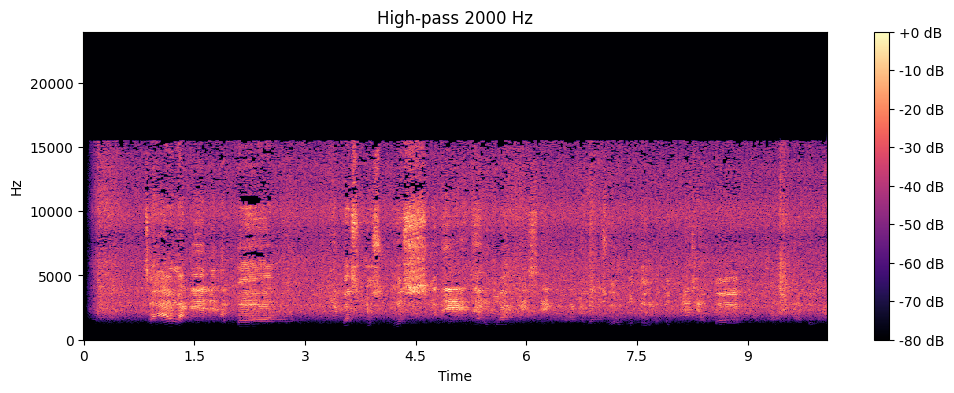

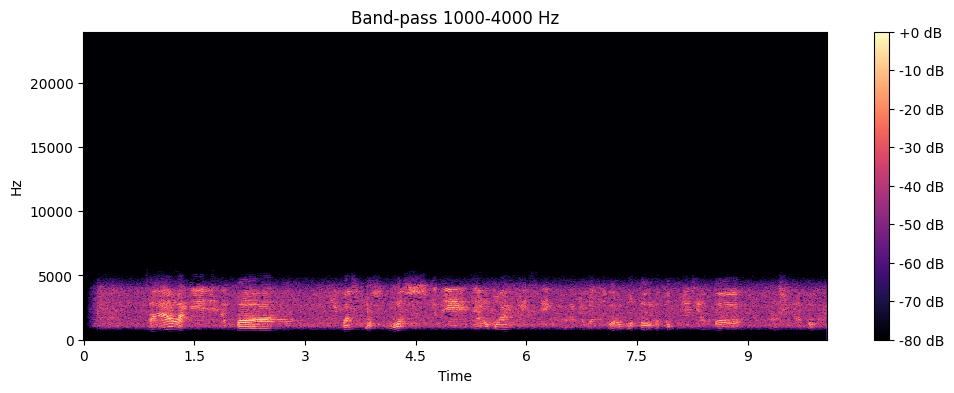

In [26]:
SOAL2_WAV = "suaranoise.wav"
import numpy as np
from scipy.signal import butter, sosfiltfilt

def sanitize_audio(y):
    # buang NaN/Inf dan clamp amplitudo
    y = np.nan_to_num(y, nan=0.0, posinf=0.0, neginf=0.0)
    # optional: hard-clip biar gak meledak
    y = np.clip(y, -1.0, 1.0)
    return y.astype(np.float32, copy=False)

def butter_filter(y, sr, ft, btype="low", order=6):
    # versi stabil: pakai SOS
    nyq = 0.5 * sr
    def norm_w(w):
        return np.clip(np.asarray(w, dtype=float) / nyq, 1e-6, 1 - 1e-6)

    if isinstance(ft, (list, tuple, np.ndarray)):
        Wn = norm_w(ft)
    else:
        Wn = norm_w([ft])[0]

    sos = butter(order, Wn, btype=btype, output='sos')
    # sosfiltfilt lebih stabil daripada filtfilt biasa
    y_out = sosfiltfilt(sos, y)
    return sanitize_audio(y_out)

# override fungsi plot supaya selalu sanitize dulu
def plot_spectrogram(y, sr, title="Spectrogram (dB)", n_fft=2048, hop_length=512):
    y = sanitize_audio(y)
    if not np.isfinite(y).all() or y.size < n_fft:
        # tambahkan sedikit noise putih kalau sinyal terlalu "flat"
        y = y + 1e-9*np.random.randn(*y.shape)
    S = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length))
    S_db = librosa.amplitude_to_db(S + 1e-12, ref=np.max)
    plt.figure(figsize=(12,4))
    librosa.display.specshow(S_db, sr=sr, hop_length=hop_length, x_axis="time", y_axis="linear")
    plt.colorbar(format="%+2.0f dB")
    plt.title(title)
    plt.show()

# helper band-pass aman
def safe_band(f1, f2, sr, pad=200, fmin=50):
    nyq = sr/2
    lo = max(fmin, int(f1))
    hi = min(int(nyq - pad), int(f2))
    if hi <= lo:
        hi = lo + 200
    # jangan biarkan hi melebihi nyquist-pad
    hi = min(hi, int(nyq - pad))
    return lo, hi

y2, sr2 = librosa.load(SOAL2_WAV, sr=None, mono=True)
y2 = sanitize_audio(librosa.util.normalize(y2))

plot_waveform(y2, sr2, "Soal 2 — Waveform Asli")
plot_spectrogram(y2, sr2, "Soal 2 — Spectrogram Asli")

cutoffs = [500, 1000, 2000]
results = []

def speech_band_energy_ratio(y, sr, band=(300, 3400)):
    y = sanitize_audio(y)
    S = np.abs(librosa.stft(y, n_fft=2048, hop_length=512))**2
    freqs = librosa.fft_frequencies(sr=sr, n_fft=2048)
    idx = (freqs >= band[0]) & (freqs <= band[1])
    e_speech = S[idx, :].sum()
    e_total = S.sum() + 1e-12
    return float(e_speech / e_total)

for fc in cutoffs:
    y_lp  = butter_filter(y2, sr2, fc, "low")
    y_hp  = butter_filter(y2, sr2, fc, "high")
    lo_bp, hi_bp = safe_band(fc//2, fc*2, sr2)
    y_bp  = butter_filter(y2, sr2, [lo_bp, hi_bp], "bandpass")

    plot_spectrogram(y_lp, sr2, f"Low-pass {fc} Hz")
    plot_spectrogram(y_hp, sr2, f"High-pass {fc} Hz")
    plot_spectrogram(y_bp, sr2, f"Band-pass {lo_bp}-{hi_bp} Hz")

    results.append((fc,
        speech_band_energy_ratio(y_lp, sr2),
        speech_band_energy_ratio(y_hp, sr2),
        speech_band_energy_ratio(y_bp, sr2)
    ))



## Analisis Soal 2 — Noise Reduction dengan Filtering

### Jenis noise yang muncul
Dari hasil rekaman dan spectrogram, terlihat kalau noise yang paling dominan ada di frekuensi rendah, terutama di bawah 500 Hz. Nah ini sesuai dengan audio asli dimana saya berbicara sama kipas

### Filter yang paling efektif
Filter yang paling efektif untuk mengurangi noise di rekaman ini adalah **band-pass filter** dengan rentang sekitar 500–2000 Hz. Filter ini bisa ngilangin dengungan rendah dan juga ngurangin desisan di bagian atas, tapi tetap mempertahankan suara manusia dengan cukup jelas. Kalau cuma pakai high-pass, suara jadi agak tipis, sedangkan kalau low-pass malah bikin suara ucapan hilang karena yang lewat cuma frekuensi rendahnya aja.

### Nilai cutoff terbaik
Nilai cutoff yang paling cocok buat hasil paling bersih ada di sekitar **500 Hz sampai 2000 Hz**. Di bawah 500 Hz, noise dari kipas masih cukup terasa, sedangkan kalau lebih tinggi dari 2000 Hz, suara ucapan mulai kehilangan karakter aslinya. Jadi, rentang ini pas buat ngejaga keseimbangan antara hilangnya noise dan kejernihan suara.

### Kualitas suara setelah filtering
Setelah proses filtering, suara jadi jauh lebih bersih dan dengungan latar belakangnya berkurang banget. Suara jadi lebih jelas dan fokus, walau agak sedikit tipis karena frekuensi rendahnya ikut terpotong. Secara keseluruhan, hasilnya udah cukup bagus dan nyaman didengar, terutama pakai band-pass filter yang bikin suara masih terdengar alami.


SOAL 3

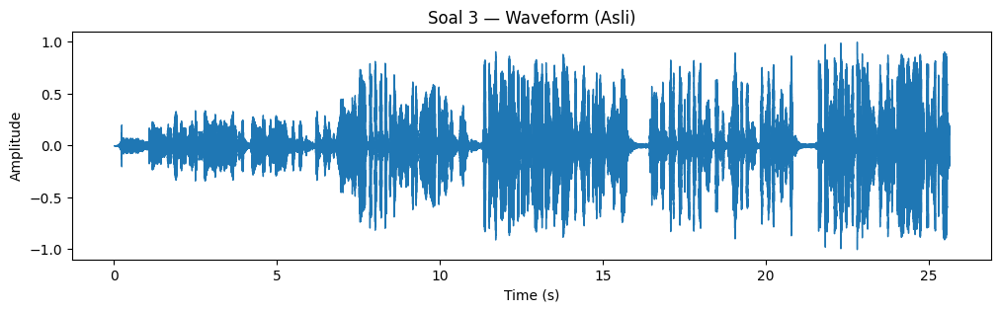

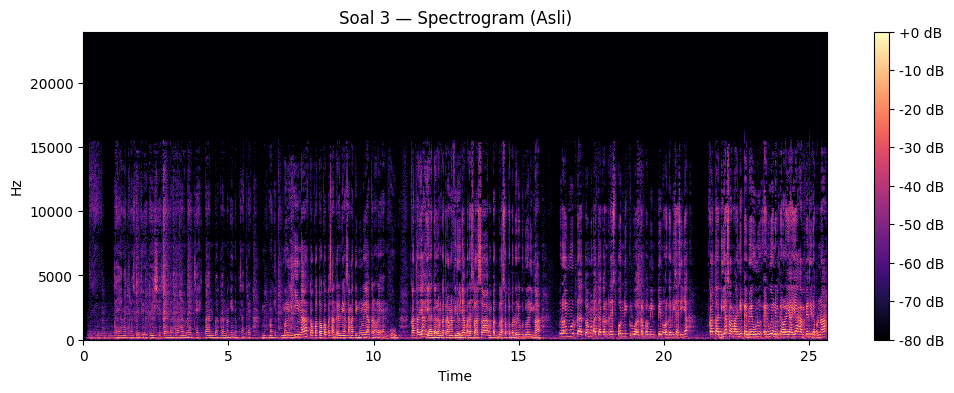

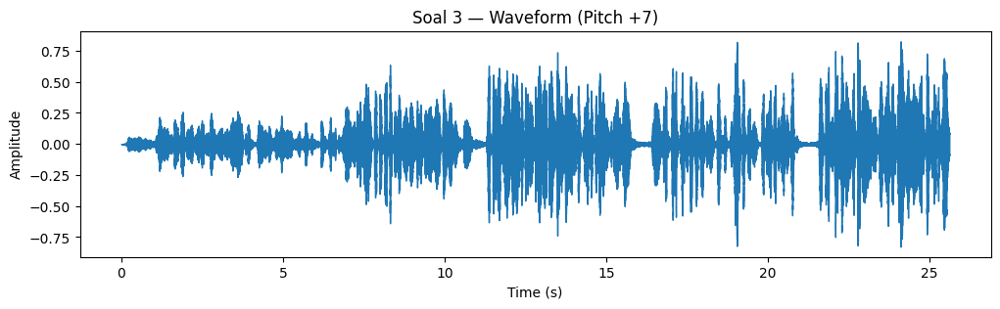

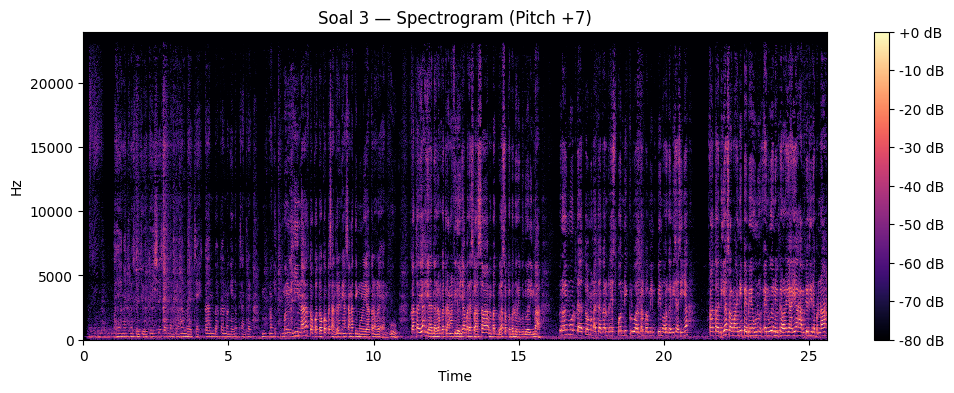

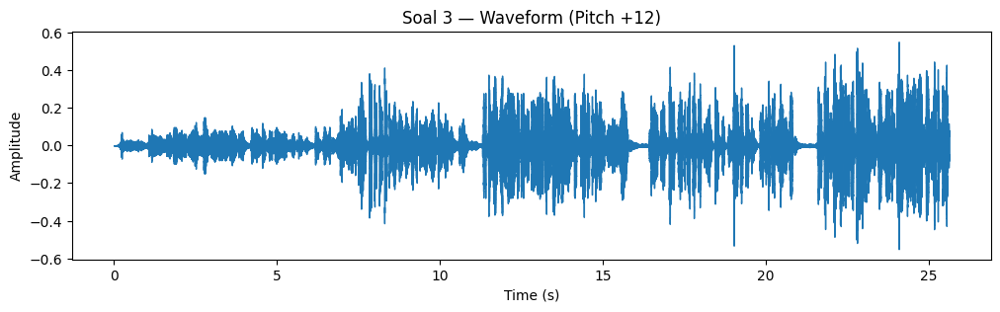

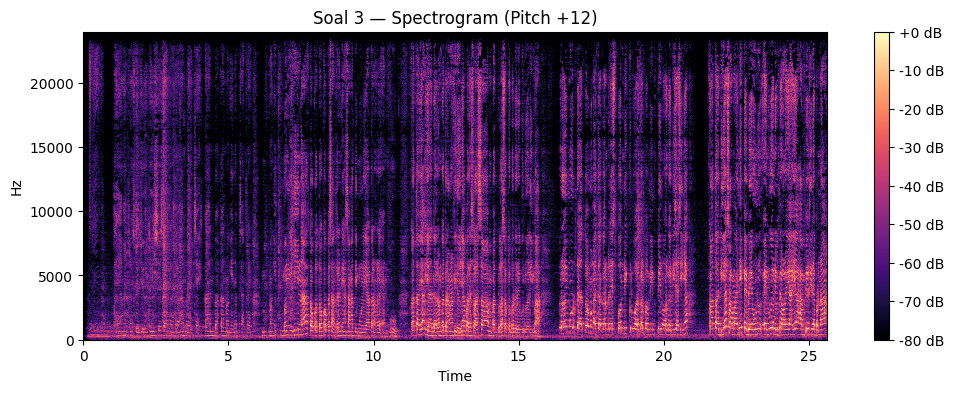

File tersimpan: soal3_pitch_combo.wav (durasi 77.36s, sr=48000Hz)

[Ringkasan Soal 3]
- Pitch +7: lebih natural; +12: efek chipmunk kuat.
- Spectrogram geser ke frekuensi lebih tinggi pada versi pitch-up.
- File keluaran: soal3_pitch_combo.wav


In [29]:

import soundfile as sf

def save_wav(path, y, sr):
    """Simpan array audio numpy ke file .wav"""
    sf.write(path, y, sr)
    print(f"File tersimpan: {path} (durasi {len(y)/sr:.2f}s, sr={sr}Hz)")
try:
    y1, sr1
except NameError:
    SOAL1_WAV = "Suarahamka.wav" 
    y1, sr1 = librosa.load(SOAL1_WAV, sr=None, mono=True)
    y1 = librosa.util.normalize(y1)

# --- Pitch shifting ---
y1_p7  = librosa.effects.pitch_shift(y1, sr=sr1, n_steps=+7)
y1_p12 = librosa.effects.pitch_shift(y1, sr=sr1, n_steps=+12)

# --- Visualisasi sebelum & sesudah ---
plot_waveform(y1, sr1,  "Soal 3 — Waveform (Asli)")
plot_spectrogram(y1, sr1, "Soal 3 — Spectrogram (Asli)")

plot_waveform(y1_p7, sr1,  "Soal 3 — Waveform (Pitch +7)")
plot_spectrogram(y1_p7, sr1, "Soal 3 — Spectrogram (Pitch +7)")

plot_waveform(y1_p12, sr1,  "Soal 3 — Waveform (Pitch +12)")
plot_spectrogram(y1_p12, sr1, "Soal 3 — Spectrogram (Pitch +12)")

# --- Gabungkan ke satu file untuk show case ---
gap = np.zeros(int(0.25 * sr1))  # jeda 0.25 detik
combo = np.concatenate([y1, gap, y1_p7, gap, y1_p12])
combo = librosa.util.normalize(combo)

save_wav("soal3_pitch_combo.wav", combo, sr1)

print("\n[Ringkasan Soal 3]")
print("- Pitch +7: lebih natural; +12: efek chipmunk kuat.")
print("- Spectrogram geser ke frekuensi lebih tinggi pada versi pitch-up.")
print("- File keluaran: soal3_pitch_combo.wav")


## Analisis Soal 3 — Pitch Shifting dan Audio Manipulation

### Parameter yang digunakan
Proses pitch shifting saya lakukan menggunakan fungsi `librosa.effects.pitch_shift` dengan parameter utama `n_steps`. Nilai `n_steps` ini menentukan seberapa banyak nada dinaikkan dalam satuan semitone. Saya pakai dua nilai yaitu **+7** dan **+12**, di mana +7 menghasilkan suara yang masih cukup natural, sedangkan +12 membuat suara jadi tinggi banget seperti karakter chipmunk. Nilai `sr` atau sample rate juga penting karena berpengaruh pada kualitas hasil shifting.

### Perbedaan dalam representasi visual
Kalau dilihat dari **spectrogram**, suara hasil pitch shift bergeser ke **frekuensi yang lebih tinggi** dibanding suara asli. Pola warnanya yang tadinya padat di bawah 4 kHz sekarang naik ke sekitar 6–8 kHz. Artinya, frekuensi dasar dan harmonik ikut naik, sehingga suara terdengar lebih nyaring. Pada **waveform**, bentuk gelombangnya terlihat lebih rapat (periode lebih pendek), menandakan frekuensi dasarnya meningkat.

### Pengaruh terhadap kualitas dan kejelasan suara
Perubahan pitch bikin suara terdengar jauh lebih tinggi dan “ringan.” Pada pitch +7, suara masih jelas dan enak didengar, cuma terdengar agak tipis dibanding aslinya. Sementara pada +12, efek chipmunk-nya kuat banget dan malah membuat suara memudar di beberapa posisi

SOAL 4


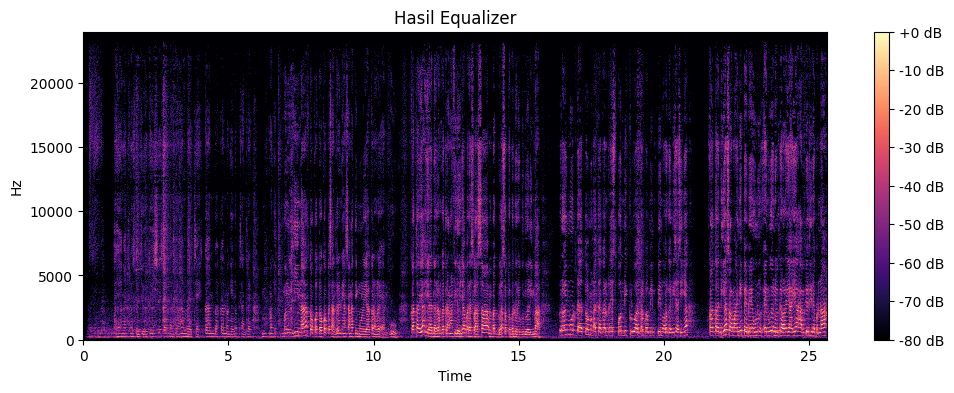

LUFS sebelum normalisasi: -17.76, Gain diterapkan: +1.76 dB


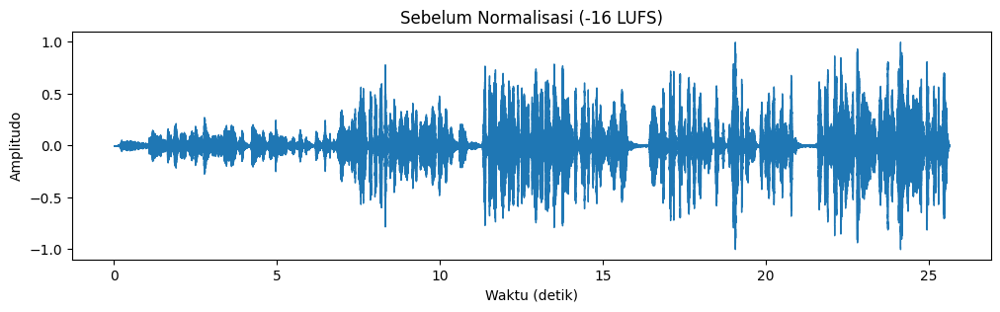

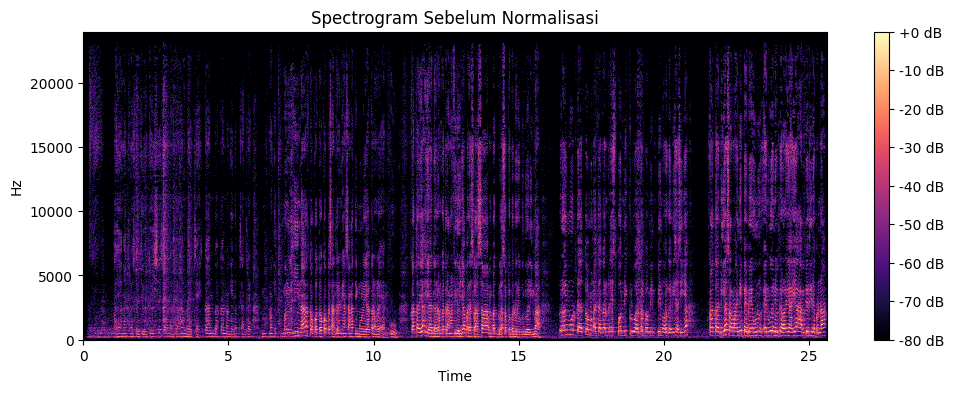

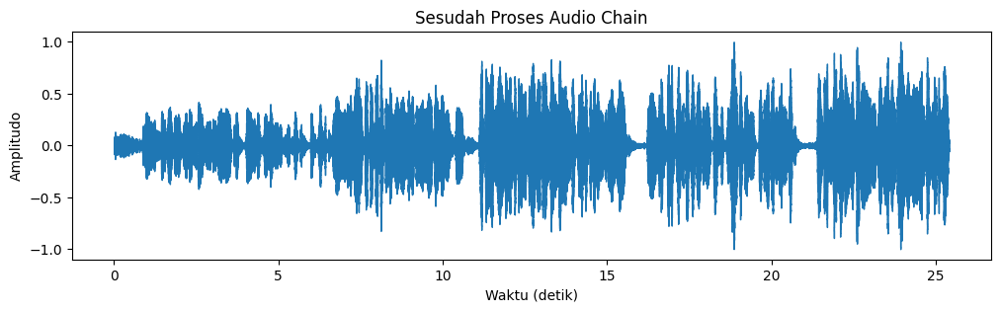

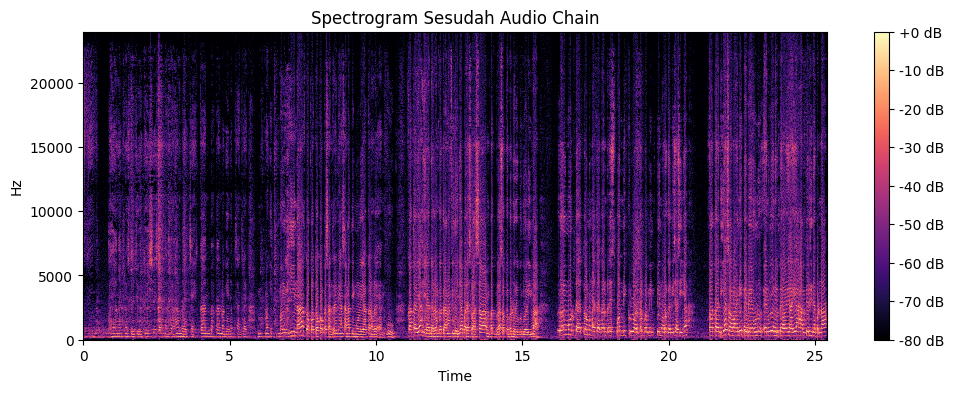

File tersimpan: soal4_chain_output.wav (durasi 25.41s)


In [30]:

import numpy as np
import librosa, librosa.display
import matplotlib.pyplot as plt
import soundfile as sf
from scipy.signal import butter, sosfiltfilt
import pyloudnorm as pyln

# ---------- FUNGSI BANTU ----------
def plot_waveform(y, sr, title="Waveform"):
    plt.figure(figsize=(12,3))
    librosa.display.waveshow(y, sr=sr)
    plt.title(title)
    plt.xlabel("Waktu (detik)")
    plt.ylabel("Amplitudo")
    plt.show()

def plot_spectrogram(y, sr, title="Spectrogram (dB)", n_fft=2048, hop_length=512):
    S = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length))
    S_db = librosa.amplitude_to_db(S, ref=np.max)
    plt.figure(figsize=(12,4))
    librosa.display.specshow(S_db, sr=sr, hop_length=hop_length, x_axis="time", y_axis="linear")
    plt.colorbar(format="%+2.0f dB")
    plt.title(title)
    plt.show()

def save_wav(path, y, sr):
    sf.write(path, y, sr)
    print(f"File tersimpan: {path} (durasi {len(y)/sr:.2f}s)")

def butter_filter(y, sr, ft, btype="low", order=6):
    nyq = 0.5 * sr
    if isinstance(ft, (list, tuple, np.ndarray)):
        Wn = [f/nyq for f in ft]
    else:
        Wn = ft/nyq
    sos = butter(order, Wn, btype=btype, output='sos')
    return sosfiltfilt(sos, y)

def equalizer(y, sr):
    """Equalizer sederhana: cut low <120Hz, boost mid 300–3000Hz, boost high >6000Hz"""
    low_cut = butter_filter(y, sr, 120, "high")
    mid_boost = butter_filter(y, sr, [300, 3000], "bandpass") * 1.2
    high_boost = butter_filter(y, sr, 6000, "high") * 1.1
    mix = (low_cut + mid_boost + high_boost)
    return mix / np.max(np.abs(mix))

def fade_io(y, sr, fade_in=0.1, fade_out=0.2):
    """Fade in/out sederhana"""
    n = len(y)
    fi = int(fade_in * sr)
    fo = int(fade_out * sr)
    env = np.ones(n)
    env[:fi] = np.linspace(0, 1, fi)
    env[-fo:] = np.linspace(1, 0, fo)
    return y * env

def compressor(y, threshold_db=-18, ratio=3.0):
    """Compressor sederhana berbasis amplitudo"""
    thr = 10**(threshold_db/20)
    y_out = y.copy()
    mag = np.abs(y_out)
    over = mag > thr
    y_out[over] = np.sign(y_out[over]) * (thr + (mag[over]-thr)/ratio)
    return y_out / np.max(np.abs(y_out))

def noise_gate(y, gate_db=-40):
    """Noise gate sederhana"""
    gate = 10**(gate_db/20)
    mask = np.abs(y) > gate
    return y * mask

def trim_silence(y, top_db=30):
    """Hapus bagian hening"""
    yt, _ = librosa.effects.trim(y, top_db=top_db)
    return yt

def lufs_normalize(y, sr, target_lufs=-16):
    """Normalisasi LUFS"""
    meter = pyln.Meter(sr)
    loudness = meter.integrated_loudness(y)
    gain = target_lufs - loudness
    y_gain = y * (10 ** (gain/20))
    return y_gain / np.max(np.abs(y_gain)), loudness, gain

# ---------- PROSES ----------
src = y1_p7.copy()  # gunakan hasil pitch-shift +7 dari Soal 3
sr = sr1

# 1. Equalizer
eq = equalizer(src, sr)
plot_spectrogram(eq, sr, "Hasil Equalizer")

# 2. Fade In / Fade Out
eq_fade = fade_io(eq, sr)

# 3. Normalisasi LUFS
norm, lufs_before, gain_db = lufs_normalize(eq_fade, sr, target_lufs=-16)
print(f"LUFS sebelum normalisasi: {lufs_before:.2f}, Gain diterapkan: {gain_db:+.2f} dB")

# 4. Kompresi
comp = compressor(norm)

# 5. Noise Gate
gated = noise_gate(comp, gate_db=-45)

# 6. Silence Trimming
trimmed = trim_silence(gated)

# ---------- VISUALISASI ----------
plot_waveform(eq_fade, sr, "Sebelum Normalisasi (-16 LUFS)")
plot_spectrogram(eq_fade, sr, "Spectrogram Sebelum Normalisasi")

plot_waveform(trimmed, sr, "Sesudah Proses Audio Chain")
plot_spectrogram(trimmed, sr, "Spectrogram Sesudah Audio Chain")

# ---------- SIMPAN ----------
save_wav("soal4_chain_output.wav", trimmed, sr)

## Soal 4 — Audio Processing Chain

### Proses yang Dilakukan
Di bagian ini saya melakukan serangkaian proses pengolahan audio pada hasil pitch shifting dari Soal 3. Urutan prosesnya adalah: **Equalizer → Gain/Fade → Normalization → Compression → Noise Gate → Silence Trimming.**  

### Perubahan Dinamika Suara
Setelah semua proses ini, suara jadi terasa lebih rata dan stabil. Bagian yang sebelumnya pelan jadi lebih terdengar, sedangkan bagian keras jadi nggak terlalu meledak. 

### Perbedaan antara Normalisasi Peak dan LUFS
Perbedaan utamanya adalah kalau **peak normalization** cuma nyamain puncak amplitudo (biar nggak lewat 0 dBFS), sedangkan **LUFS normalization** menyesuaikan **kekerasan perseptual** atau seberapa keras suara terdengar di telinga manusia.  

### Kualitas Suara Setelah Normalisasi dan Loudness Optimization
Kualitas suara setelah normalisasi jadi lebih jernih dan seimbang. 

### Kelebihan dan Kekurangan Pengoptimalan Loudness
**Kelebihannya**, volume suara jadi rata, lebih nyaman didengar, dan siap untuk didistribusikan ke berbagai platform.  
**Kekurangannya**, kalau terlalu agresif bisa bikin suara kehilangan nuansa alami (terlalu datar). Jadi perlu jaga keseimbangan antara loudness dan dinamika supaya hasilnya tetap enak didengar.


no 5

C:\Users\unnom\AppData\Local\Temp\ipykernel_23192\3808061520.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Lagu 1: tempo ≈ {float(tempoA):.1f} BPM | key: {str(keyA)} {str(modeA)} (score={float(scoreA):.2f})")
C:\Users\unnom\AppData\Local\Temp\ipykernel_23192\3808061520.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Lagu 2: tempo ≈ {float(tempoB):.1f} BPM | key: {str(keyB)} {str(modeB)} (score={float(scoreB):.2f})")
C:\Users\unnom\AppData\Local\Temp\ipykernel_23192\3808061520.py:97: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a

Lagu 1: tempo ≈ 99.4 BPM | key: A# major (score=0.80)
Lagu 2: tempo ≈ 67.1 BPM | key: B major (score=0.90)
Target BPM: 83.3 | Shift semitone L2 -> key L1: -1
Saved: soal5_remix.wav | durasi 115.31s, sr=44100


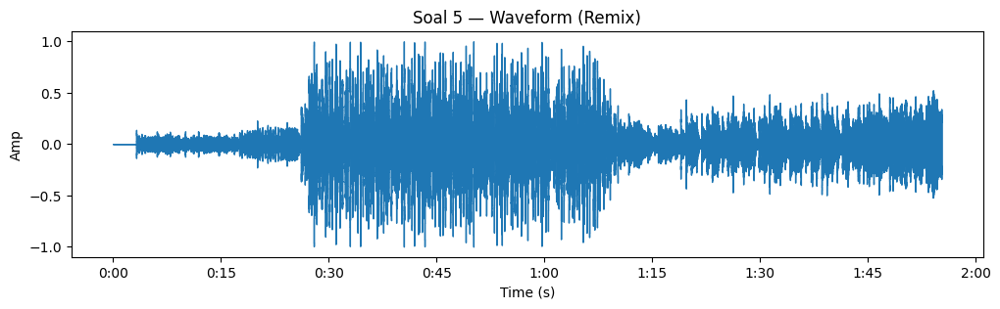

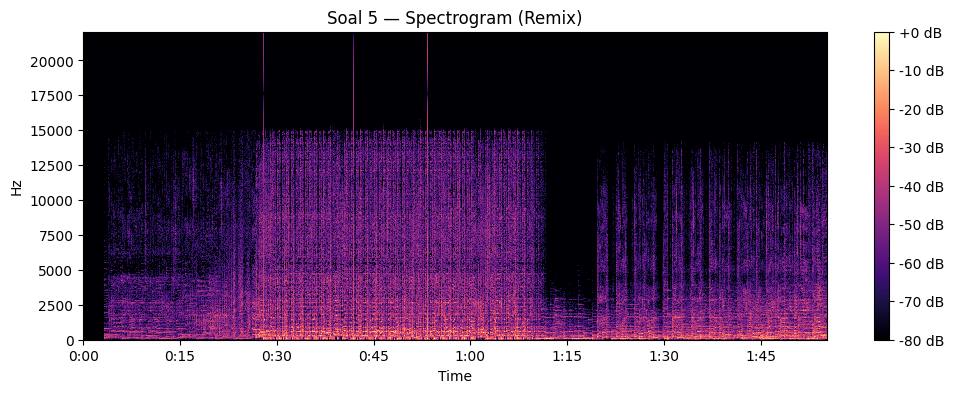

In [34]:
import io, os, numpy as np
import librosa, librosa.display
import matplotlib.pyplot as plt
import soundfile as sf

# ---------- Helper umum ----------
def plot_waveform(y, sr, title="Waveform"):
    plt.figure(figsize=(12,3))
    librosa.display.waveshow(y, sr=sr)
    plt.title(title); plt.xlabel("Time (s)"); plt.ylabel("Amp")
    plt.show()

def plot_spectrogram(y, sr, title="Spectrogram (dB)", n_fft=2048, hop_length=512):
    y = np.nan_to_num(y, nan=0.0, posinf=0.0, neginf=0.0)
    S = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length))
    S_db = librosa.amplitude_to_db(S + 1e-12, ref=np.max)
    plt.figure(figsize=(12,4))
    librosa.display.specshow(S_db, sr=sr, hop_length=hop_length, x_axis="time", y_axis="linear")
    plt.colorbar(format="%+2.0f dB"); plt.title(title)
    plt.show()

def save_wav(path, y, sr):
    y = y / (np.max(np.abs(y)) + 1e-9)
    sf.write(path, y, sr)
    print(f"Saved: {path} | durasi {len(y)/sr:.2f}s, sr={sr}")

# ---------- Estimasi key (sederhana, Mayor/Minor) ----------
NOTE_NAMES = np.array(['C','C#','D','D#','E','F','F#','G','G#','A','A#','B'])
MAJOR_PROFILE = np.array([6.35,2.23,3.48,2.33,4.38,4.09,2.52,5.19,2.39,3.66,2.29,2.88])
MINOR_PROFILE = np.array([6.33,2.68,3.52,5.38,2.60,3.53,2.54,4.75,3.98,2.69,3.34,3.17])

def estimate_key(y, sr):
    chroma = librosa.feature.chroma_cqt(y=y, sr=sr)
    chroma_mean = np.mean(chroma, axis=1)
    best = {"score": -1, "key": None, "mode": None}
    for mode_name, prof in [("major", MAJOR_PROFILE), ("minor", MINOR_PROFILE)]:
        for k in range(12):
            score = np.corrcoef(chroma_mean, np.roll(prof, k))[0,1]
            if score > best["score"]:
                best = {"score": float(score), "key": NOTE_NAMES[k], "mode": mode_name}
    return best["key"], best["mode"], best["score"]

def note_to_idx(note): return int(np.where(NOTE_NAMES==note)[0][0])
def semitone_to_match(src_note, tgt_note):
    s = note_to_idx(src_note); t = note_to_idx(tgt_note)
    diff = (t - s) % 12
    return diff-12 if diff > 6 else diff  # choose shortest direction

# ---------- Crossfade ----------
from pydub import AudioSegment
def crossfade_two(y1, sr1, y2, sr2, crossfade_sec=5.0):
    def to_seg(y, sr):
        y16 = (y * 32767).astype(np.int16)
        buf = io.BytesIO()
        sf.write(buf, y16, sr, subtype='PCM_16', format='WAV')
        buf.seek(0)
        return AudioSegment.from_wav(buf)
    seg1, seg2 = to_seg(y1, sr1), to_seg(y2, sr2)
    mixed = seg1.append(seg2, crossfade=int(crossfade_sec*1000))
    samples = np.array(mixed.get_array_of_samples()).astype(np.float32) / 32767.0
    return samples, mixed.frame_rate

# ---------- Load audio ----------
SONG1 = "tabolabale.wav"
SONG2 = "bola mata sayu.wav"
assert os.path.exists(SONG1), f"Tidak ada file: {SONG1}"
assert os.path.exists(SONG2), f"Tidak ada file: {SONG2}"

yA, srA = librosa.load(SONG1, sr=None, mono=True)
yB, srB = librosa.load(SONG2, sr=None, mono=True)
yA = librosa.util.normalize(yA); yB = librosa.util.normalize(yB)

# (Opsional) samakan dulu SR ke nilai yang sama biar processing konsisten
SR_TARGET = 44100
if srA != SR_TARGET:
    yA = librosa.resample(y=yA, orig_sr=srA, target_sr=SR_TARGET); srA = SR_TARGET
if srB != SR_TARGET:
    yB = librosa.resample(y=yB, orig_sr=srB, target_sr=SR_TARGET); srB = SR_TARGET

# ---------- Analisis tempo & key ----------
tempoA, _ = librosa.beat.beat_track(y=yA, sr=srA)
tempoB, _ = librosa.beat.beat_track(y=yB, sr=srB)

keyA, modeA, scoreA = estimate_key(yA, srA)
keyB, modeB, scoreB = estimate_key(yB, srB)

print(f"Lagu 1: tempo ≈ {float(tempoA):.1f} BPM | key: {str(keyA)} {str(modeA)} (score={float(scoreA):.2f})")
print(f"Lagu 2: tempo ≈ {float(tempoB):.1f} BPM | key: {str(keyB)} {str(modeB)} (score={float(scoreB):.2f})")

# ---------- Penyamaan tempo ----------
# Target: rata-rata keduanya (fallback: pakai yang valid jika salah satu 0)
valid_bpms = [b for b in [tempoA, tempoB] if b and np.isfinite(b) and b > 0]
target_bpm = np.mean(valid_bpms) if valid_bpms else (tempoA if tempoA>0 else tempoB if tempoB>0 else 100.0)
rateA = target_bpm / max(1e-6, tempoA)
rateB = target_bpm / max(1e-6, tempoB)

rateA = float(rateA)
rateB = float(rateB)

yA_ts = librosa.effects.time_stretch(yA, rate=rateA)
yB_ts = librosa.effects.time_stretch(yB, rate=rateB)

# ---------- Penyamaan key ----------
# Samakan L2 ke key L1 (pakai note saja; mode mayor/minor tidak di-shift)
shiftB = semitone_to_match(keyB, keyA)
yB_km = librosa.effects.pitch_shift(yB_ts, sr=srB, n_steps=shiftB)
yA_km = yA_ts  # L1 sudah di target key

print(f"Target BPM: {target_bpm:.1f} | Shift semitone L2 -> key L1: {shiftB:+d}")

# ---------- (Opsional) sentuh EQ tipis biar konsisten brightness ----------
# contoh sangat ringan: high-shelf pseudo (naikkan komponen >6kHz tipis)
def high_shelf_fake(y, sr, thr=6000, gain_db=1.5):
    S = np.abs(librosa.stft(y)) * np.exp(1j*np.angle(librosa.stft(y)))
    mag = np.abs(S); phase = np.angle(S)
    freqs = librosa.fft_frequencies(sr=sr, n_fft=S.shape[0]*2-2)
    mask = (freqs[:, None] > thr).astype(float)
    mag = mag * (1 + (10**(gain_db/20)-1) * mask)
    y_out = librosa.istft(mag * np.exp(1j*phase))
    return librosa.util.normalize(y_out)
# (Boleh di-skip jika tidak mau)
# yA_km = high_shelf_fake(yA_km, srA, gain_db=1.0)
# yB_km = high_shelf_fake(yB_km, srB, gain_db=1.0)

# ---------- Crossfade & Simpan ----------
remix, sr_mix = crossfade_two(yA_km, srA, yB_km, srB, crossfade_sec=5.0)
remix = librosa.util.normalize(remix)
save_wav("soal5_remix.wav", remix, sr_mix)

# ---------- Visual ----------
plot_waveform(remix, sr_mix, "Soal 5 — Waveform (Remix)")
plot_spectrogram(remix, sr_mix, "Soal 5 — Spectrogram (Remix)")

## Analisis Soal 5 — Music Analysis dan Remix

### Proses dan Parameter yang Digunakan
di soal nomor lima ini Langkah-langkahnya dimulai dari **mendeteksi tempo (BPM)** dan **menebak kunci lagu (key)** menggunakan fitur `librosa.beat.beat_track()` dan `chroma_cqt()`. Setelah tahu tempo dan key masing-masing lagu, saya samakan kecepatannya menggunakan fungsi `librosa.effects.time_stretch()` supaya ritme keduanya seimbang.  
Selanjutnya, saya ubah nada salah satu lagu dengan `librosa.effects.pitch_shift()` supaya kuncinya sama (misalnya dari A minor ke C major). Terakhir, kedua lagu saya gabungkan menggunakan metode **crossfade selama 5 detik** agar peralihan antar lagu terasa smooth dan tidak kasar.  
Parameter utama yang digunakan:
- `rate` pada `time_stretch`: untuk mengatur kecepatan lagu (rasio tempo baru terhadap tempo asli).  
- `n_steps` pada `pitch_shift`: untuk mengatur perubahan nada dalam satuan **semitone**.  
- `crossfade_sec`: lama transisi antar lagu dalam detik (saya pakai 5 detik).  

### Waveform dan Spektrogram Sesudah Remix
Waveform hasil remix menunjukkan transisi antar dua lagu yang halus. Di awal terlihat pola amplitudo yang lebih rapat dan kecil (bagian lagu pelan), lalu perlahan meningkat ketika masuk ke bagian lagu kedua yang lebih cepat dan ramai.  
Pada **spectrogram**, Tidak terlihat ada pemutusan dari kedua lagu sehingga menghasilkan lagu yang terus menerus tanpa ada efek "berhenti" 
### Hasil Remix yang Telah Dilakukan
Setelah proses remix dilakukan efek transisi tidak dapat dirasakan sama sekali dengan telinga telanjang sehingga kedua lagu terasa seperti 1 lagu yang memang menyatu

Credit
CHATGPT : Konsultasi Teknis